# 딥러닝 (Week 10. CNN)

by Kyoungwon Seo (Dept. of Applied Artificial Intelligence, SeoulTech)
- e: kwseo@seoultech.ac.kr
- w: https://hai.seoultech.ac.kr

강의계획
1. 시각 피질 구조
2. 합성곱 층
  - 필터
  - 여러 가지 특성 맵 쌓기
  - 텐서플로 구현
  - 메모리 요구 사항
3. 풀링 층
4. CNN 구조
  - LeNet-5
  - AlexNet
  - GoogLeNet
  - VGGNet
  - ResNet
  - 이 외에도: Xception, SENet
5. 사전훈련된 모델을 사용한 전이 학습
6. 분류와 위치 추정
7. 객체 탐지
  - 완전 합성곱 신경망
  - YOLO
8. 시맨틱 분할

# 1. CNN

## 1) 활용

- 합성곱 신경망(CNN; convolutional neural network)은 대뇌와 시각 피질 연구에 시작됨
- 1980년대부터 이미지 인식 분야에 사용
- 이미지 검색 서비스, 자율주행 자동차, 영상 자동 분류 시스템 등에 큰 기여
- 음성 인식(voice recognition), 자연어 처리(NLP; natural language processing)에도 사용 ♣

- 행동 패턴 분석(behavior pattern analysis)에도 사용 (예: https://www.youtube.com/watch?v=VNcArJ5ems8)
- 여기서는 시각적 애플리케이션에 집중
  - 객체 탐지(object detection): 이미지 하나에서 여러 가지 객체를 구분하고 객체 주위에 바운딩 박스(bounding box)를 그리는 작업 ♣
  - 시맨틱 분할(semantic segmentation): 물체가 속한 클래스에 따라 각 픽셀을 구분하는 작업 ♣

## 2) 배경

#### (1) 시각 피질 구조

- David H. Hubel과 Torsten Wiesel의 1958년부터 시작된 시각 피질 구조에 대한 연구 (1981년 노벨 생리의학상 수상)
- 국부 수용장(local receptive field)의 원리 발견
  - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1357023/
  - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1363130/
  - https://physoc.onlinelibrary.wiley.com/doi/abs/10.1113/jphysiol.1968.sp008455


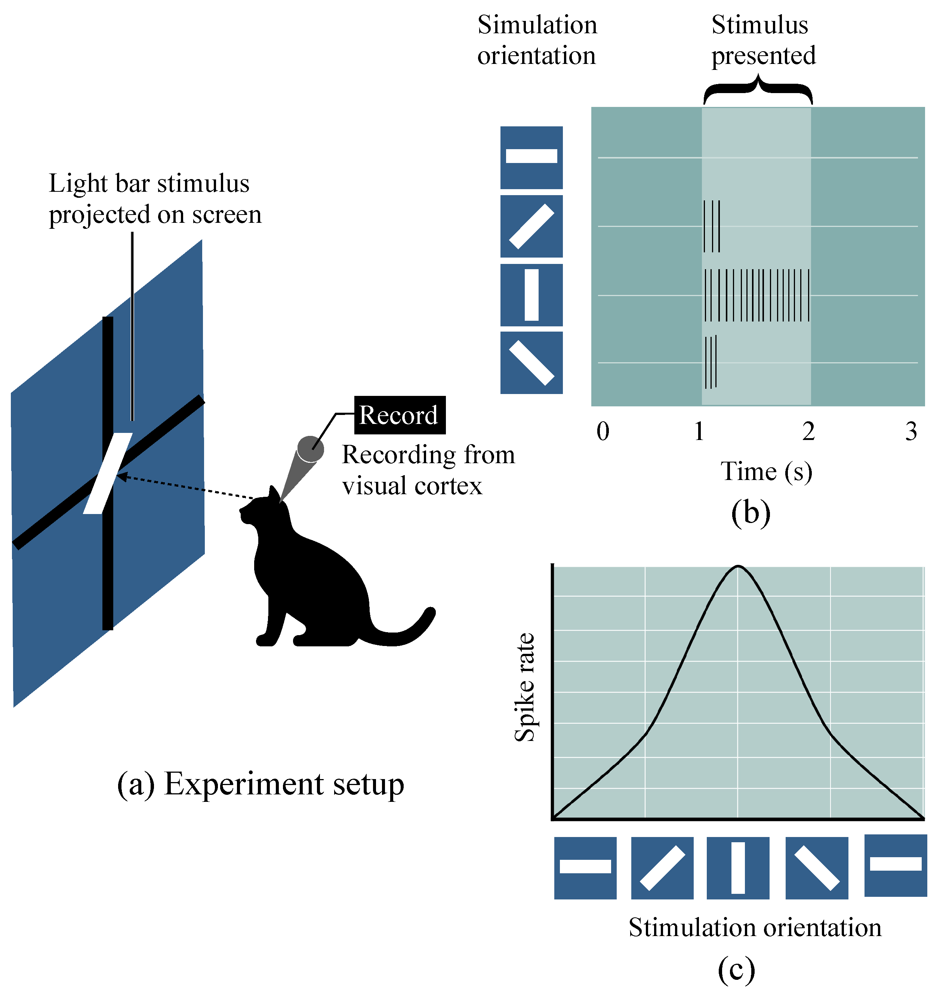

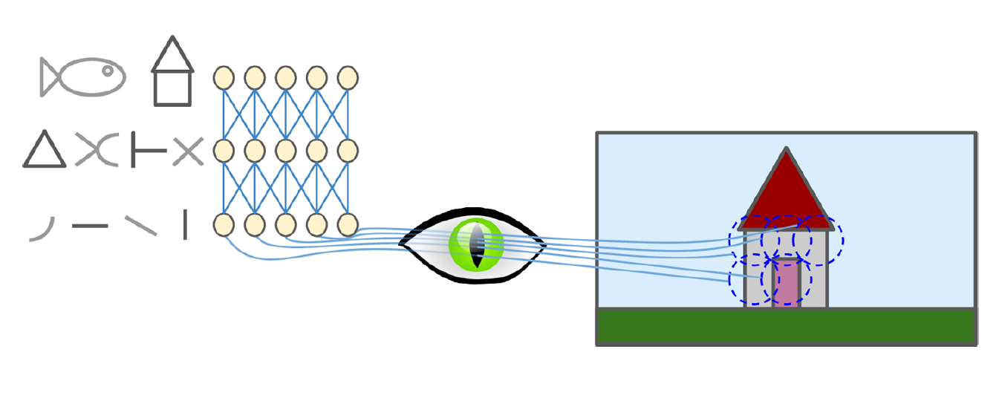

- 어떤 뉴런은 수평선의 이미지에만 반응하고 반면 다른 뉴런은 다른 각도의 선분에 반응함
- 또한 어떤 뉴런은 큰 수용장을 가져서 저수준 패턴이 조합된 더 복잡한 패턴에 반응함
- 이러한 관찰은 고수준 뉴런이 이웃한 저수준 뉴런의 출력에 기반한다는 아이디어를 이끌어냄

- Fukushima 박사 연구팀의 1980년 neocognitron 연구 (https://link.springer.com/chapter/10.1007/978-3-642-46466-9_18)
  - https://www.youtube.com/watch?v=Qil4kmvm2Sw
  - https://www.youtube.com/watch?v=oVYCjL54qoY


- 1998년 Yann Lecun의 LeNet-5 구조 ♣♣
  - 완전 연결 층, 시그모이드 활성화 함수, 합성곱 층(convolution layer), 풀링 층(pooling player) 사용

## 3) 구조

### (1) 합성곱 층

#### 1] 시각화

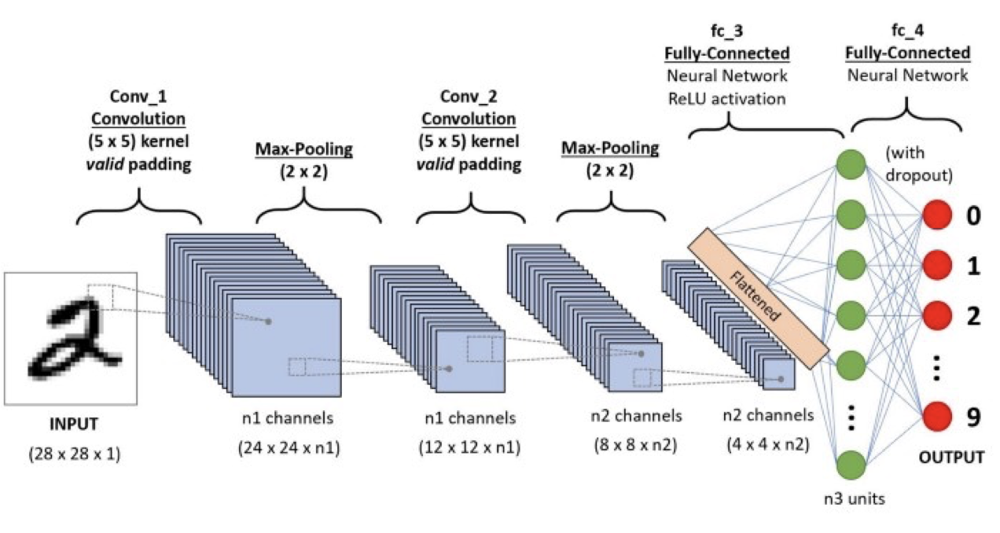

#### 2] 역할

- [1] max-pooling : 차원 축소
- [2] filter : 직선, 곡선 등 다양한 형태 학습
- [3] conv layer 여러개 거친 filter : filter에서 다양한 경우의 조합이 존재하므로 개수 증가

#### 3] 개념

- 네트워크가 첫번째 은닉층에서는 작은 저수준 특성에 집중하고, 그다음 은닉층에서는 더 큰 고수준 특성으로 조합해 나가도록 도움
- Intuitively Understanding Convolutions for Deep Learning: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1

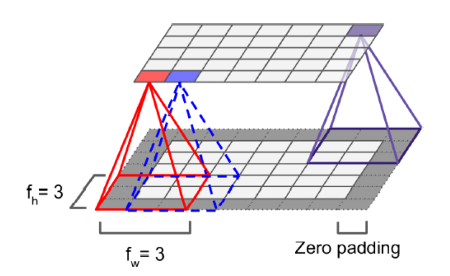

#### 2] 역할 이어서

- [4] 제로 패딩(zero padding): 높이와 너비를 이전 층과 같게 하기 위해 입력의 주위에 0을 추가하는 것
- [5] 스트라이드 (stride): 한 수용장(Receptive Field)과 다음 수용장 사이의 간격
  - ex. 스트라이드 2를 사용해 차원을 2배 축소할 수 있음

- [6] 필터

1]] 특징
- 필터(filter) 또는 합성곱 커널(convolution kernel)이라고 부르는 가중치 세트를 사용
- 층의 전체 뉴런에 적용된 하나의 필터는 하나의 특성 맵(feature map)을 만듦
    - 이 특성 맵은 필터를 가장 크게 활성화시키는 이미지의 영역을 강조함
- 훈련하는 동안 합성곱 층은 자동으로 해당 문제에서 가장 유용한 필터를 찾고 상위층은 이들을 연결하여 더 복잡한 패턴을 학습함

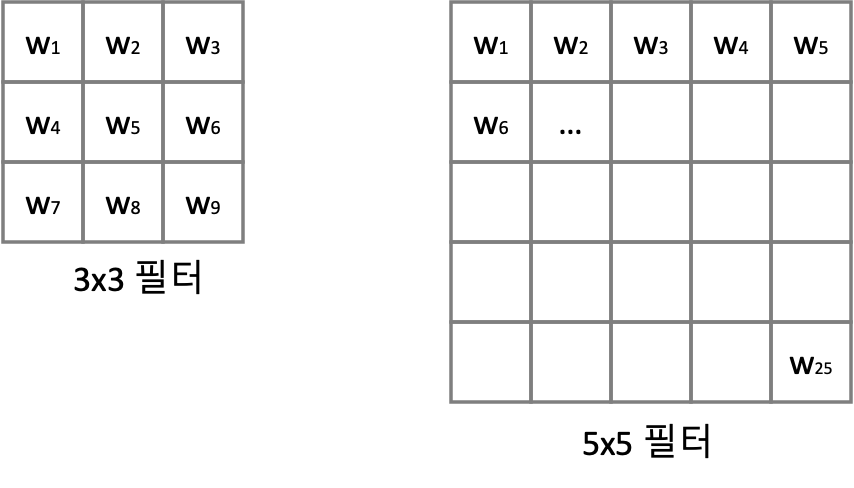

ex]] 직선 & 수평 필터

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.datasets import load_sample_image

# 샘플 이미지를 로드합니다.
china = load_sample_image("china.jpg") / 255
flower = load_sample_image("flower.jpg") / 255
images = np.array([china, flower])
batch_size, height, width, channels = images.shape

# 2개의 필터를 만듭니다.
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32)
filters[:, 3, :, 0] = 1  # 수직선
filters[3, :, :, 1] = 1  # 수평선

outputs = tf.nn.conv2d(images, filters, strides=1, padding="SAME")

In [3]:
def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")

def plot_color_image(image):
    plt.imshow(image, interpolation="nearest")
    plt.axis("off")

def crop(images):
    return images[150:220, 130:250]

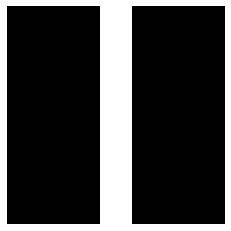

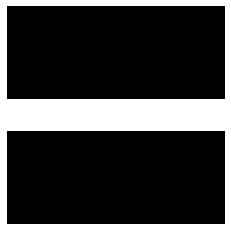

In [4]:
plot_image(filters[:, :, 0, 0])
plt.show()
plot_image(filters[:, :, 0, 1])
plt.show()

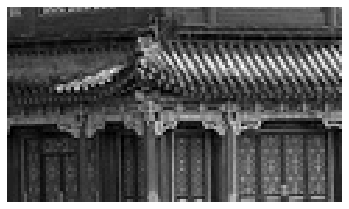

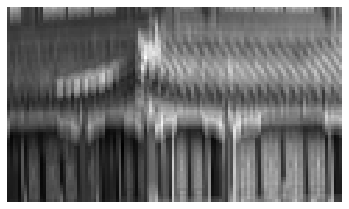

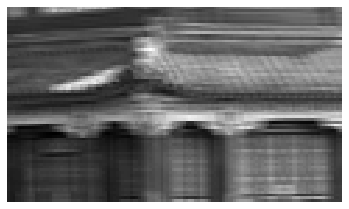

In [5]:
plot_image(crop(images[0, :, :, 0]))
plt.show()

for feature_map_index, filename in enumerate(["china_vertical", "china_horizontal"]):
    plot_image(crop(outputs[0, :, :, feature_map_index]))
    plt.show()

2]] 특성 맵 중첩

- 여러 가지 특성 맵 쌓기
    - 실제 합성곱 층은 여러 가지 필터를 동시에 적용하여 입력에 있는 여러 특성을 감지할 수 있음
    - 이미지의 특정 위치에서 어떤 패턴을 학습했다면 이미지의 다른 곳에서도 동일한 패턴 인식 가능

ex]] 오목 & 볼록 필터 ♣♣

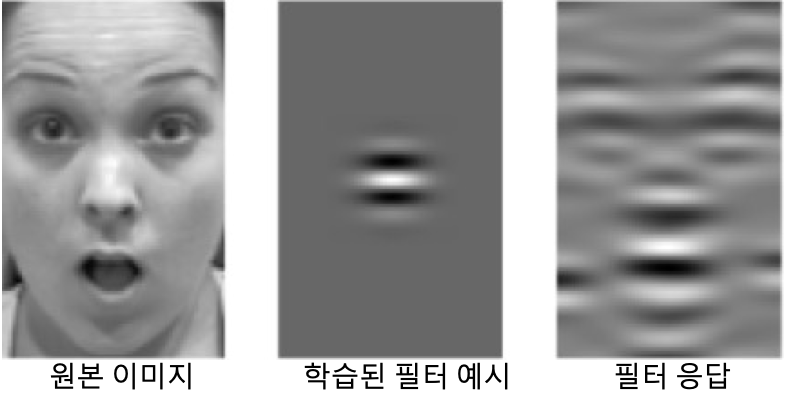

ex]] 컬러 채널

- 입력 이미지는 컬러채널(channel)마다 여러 서브층으로 구성되기도 함
  - 사진의 RGB 3채널
  - 위성 이미지는 가시광선 외에도 적외선 같은 다른 빛의 파장이 기록됨

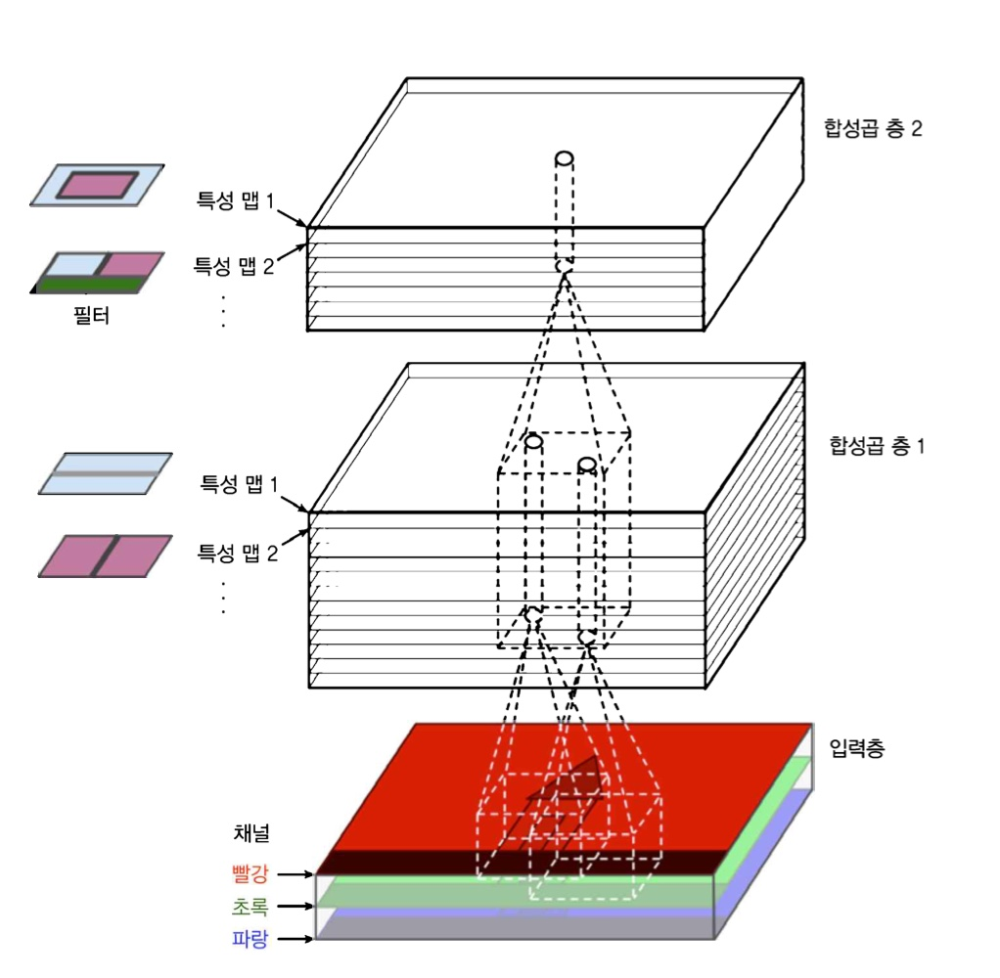

The multi-channel version in "Intuitively Understanding Convolutions for Deep Learning" 

5] 수식 ♣♣♣

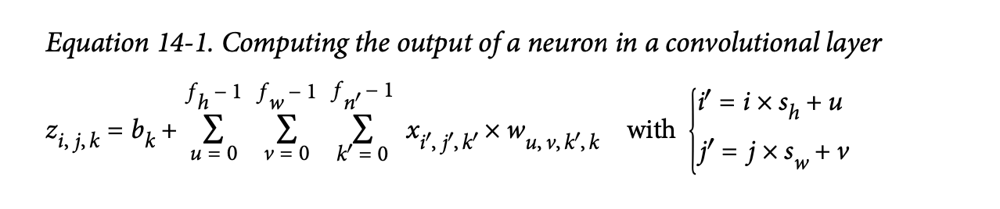

- z: 합성곱 층의 k 특성 맵에서 i행, j열에 위치한 뉴런의 출력
- b: 편향
- x: input data이며 i,j는 행과 열
- w: weight이며 u,v는 행과 열, k는 현재 특성 맵, k’는 과거 특성 맵
- f: 수용장/필터/Kernel의 높이(h)와 너비(w), n'은 이전 층의 특성 맵의 수
- s: Stride이며 h(height),w(width)를 표현

#### 6] 구현

텐서플로 구현

`keras.layers.Conv2D()`를 사용해 2D 합성곱 층 제작:

In [6]:
from tensorflow import keras

np.random.seed(42)
tf.random.set_seed(42)

conv = keras.layers.Conv2D(filters=2, kernel_size=7, strides=1,
                           padding="SAME", activation="relu", input_shape=outputs.shape)

두 개의 테스트 이미지로 이 층을 호출:

In [7]:
conv_outputs = conv(images) ## images = np.array([china, flower])
conv_outputs.shape 

TensorShape([2, 427, 640, 2])

- 출력은 4D 텐서: 배치 크기, 높이, 너비, 채널 ♣♣
  - 2개의 이미지를 입력으로 사용했기 때문에 첫 번째 차원(배치 크기)는 2
  - 다음 두 차원은 출력 특성맵의 높이와 너비
    - `padding="SAME"`(제로 패딩)와 `strides=1`로 설정했기 때문에 출력 특성맵의 높이와 너비는 입력 이미지와 같음(이 경우 427×640)
  - 마지막으로 이 합성곱 층은 2개의 필터를 사용 (따라서 마지막 차원의 크기는 2) --> 즉 입력 이미지마다 2개의 특성맵이 출력

- 필터는 초기에 랜덤하게 초기화되기 때문에 처음에는 랜덤한 패턴을 감지 ♣
- 이미지마다 출력된 2개의 특성맵을 확인:

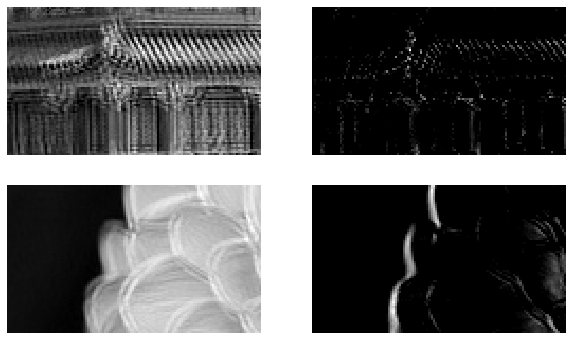

In [7]:
plt.figure(figsize=(10,6))
for image_index in (0, 1):
    for feature_map_index in (0, 1):
        plt.subplot(2, 2, image_index * 2 + feature_map_index + 1)
        plot_image(crop(conv_outputs[image_index, :, :, feature_map_index]))
plt.show()

- 필터가 초기에 랜덤하게 초기화되었지만 두 번째 필터는 에지를 감지한 것처럼 보임
- 에지 감지는 이미지 처리에 매우 유용하기 때문에 운이 좋은 것임 (늘 이렇지는 않음)

- 원한다면 필터를 수동으로 정의하고 편향을 0으로 지정할 수 있음 ♣♣
- 합성곱 층이 훈련하는 동안 적절한 필터와 편향을 학습하기 때문에 실제로는 수동으로 필터와 편향을 지정할 필요가 거의 없음 ♣

In [8]:
conv.set_weights([filters, np.zeros(2)])

이제 이 층을 동일한 두 이미지에서 다시 호출(feature map) :

In [9]:
conv_outputs = conv(images)
conv_outputs.shape 

TensorShape([2, 427, 640, 2])

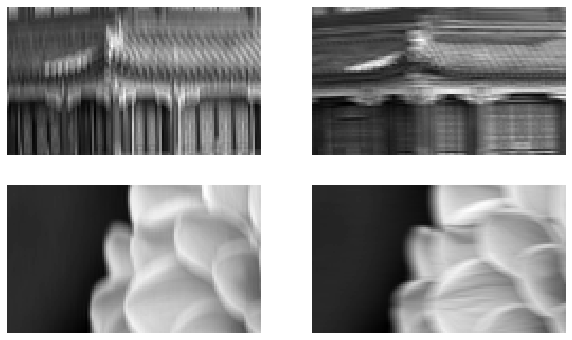

In [10]:
plt.figure(figsize=(10,6))
for image_index in (0, 1):
    for feature_map_index in (0, 1):
        plt.subplot(2, 2, image_index * 2 + feature_map_index + 1)
        plot_image(crop(conv_outputs[image_index, :, :, feature_map_index]))
plt.show()

## 4) 메모리 요구 사항

### (1) 예시

- CNN은 많은 양의 RAM을 필요로 함
- 훈련시 역전파 알고리즘이 역방향 계산을 할 때 정방향에서 계산했던 모든 중간 값을 필요로 하기 때문 ♣♣
- 예를 들어 5 * 5 필터로 스트라이드 1과 "same"패딩을 사용해 150 * 100 크기의 특성 맵 200개를 만드는 합성곱 층을 훈련할 경우 ♣♣
  - 입력 150 * 100 RGB (3채널) 이면 파라미터 수는 (5 * 5 * 3+1) * 200 = 15,200개
  - 합성곱 곱셈 수는 5 * 5 * 3(필터의 크기) * 150 * 100(특성 맵의 크기) * 200(특성 맵의 수) = 2억 2천5백만개
  - 즉 한 샘플에 대해 약 12MB를 점유하며, 만약 훈련 배치가 100개의 샘플로 이루어져 있다면 이 층은 1.2GB의 RAM을 사용하게 됨

- 추론(inference)을 할 때는 하나의 층이 점유하고 있는 RAM을 다음 층의 계산이 완료되자마자 해제할 수 있으므로 연속된 두 개의 층에서 필요로 하는 만큼의 RAM만 가지고 있으면 됨 ♣♣

### (2) 메모리 부족 시 팁

- 만약 메모리 부족으로 훈련이 실패한다면 ♣♣
  - 1] 미니배치 크기를 줄이기
  - 2] 스트라이드를 사용해 차원을 줄이기
  - 3] 몇 개 층을 제거
  - 4] 32비트 부동소수 대신 16비트 부동소수 사용
  - 5] 여러 장치로 CNN을 분산

## 3) 구조 이어서

### (2) 풀링 층

#### 1] 개념

- 풀링 층(pooling payer)는 계산량과 메모리 사용량, 과대적합 방지를 위해 파라미터 수를 줄이기 위해 입력 이미지의 부표본(subsample), 축소본을 만드는 것 ♣♣
- 크기, 스트라이드, 패딩 유형을 지정해야 함

- 풀링 연산
  - 특징 맵을 강제로 다운샘플링 하는 기법중 하나

#### 2] 종류

- [1] 최대 풀링 (max pooling): 입력 특성 맵에서 지정된 크기의 패치를 추출하고, 각 패치별로 최대값만 샘플링 함
- [2] 평균 풀링 (average pooling): 패치 영역별로 평균 값을 계산

##### [1] 최대 풀링 (Max Pooling)

In [11]:
max_pool = keras.layers.MaxPool2D(pool_size=2)

In [12]:
cropped_images = np.array([crop(image) for image in images], dtype=np.float32)
output = max_pool(cropped_images)

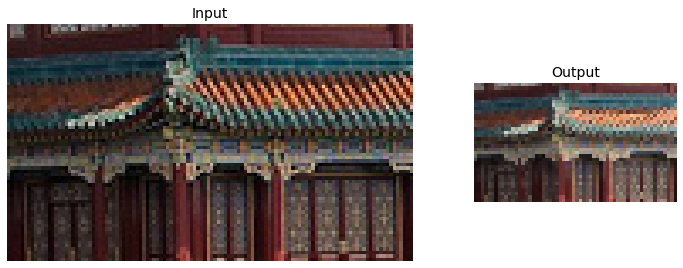

In [13]:
import matplotlib as mpl

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # 첫 번째 이미지 그리기
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output[0])  # 첫 번째 이미지 출력 그리기
ax2.axis("off")
plt.show()

1]] 장점 ♣♣

- 최대 풀링은 작은 변화에도 일정 수준의 불변성(invariance)을 만듦(가장 큰 값만을 사용하기 때문)
- 분류 작업처럼 예측이 작은 변화에 영향을 받지 않는 경우 유용함

2]] 단점

- 작은 커널(2x2)와 stride(2)를 사용하더라도 Input data의 75%를 잃게 됨
- 시멘틱 분할 같이 불변성이 필요 없고 등변성(equivariance)가 필요한 Application에는 비효율적 ♣♣

3]] 종류

- 깊이방향 최대 풀링 (depthwise max pooling) ♣♣
  - 동일한 패턴이 회전된 여러 가지 필터를 학습했을 때 회전에 상관없이 동일 출력을 만들 수 있음
  - 두께, 밝기, 왜곡, 색상 등에 대해서 불변성을 학습할 수 있음

##### [2] 평균 풀링 (Average Pooling)

In [14]:
avg_pool = keras.layers.AvgPool2D(pool_size=2)

In [15]:
output_avg = avg_pool(cropped_images)

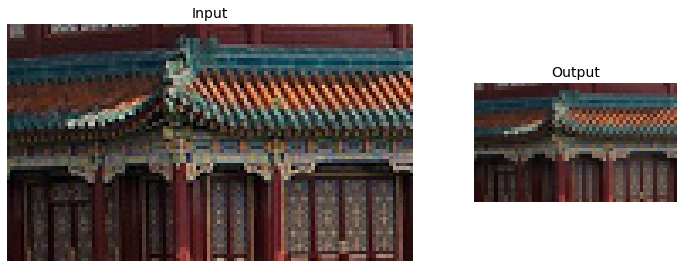

In [16]:
fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # 첫 번째 이미지 그리기
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output_avg[0])  # 첫 번째 이미지 출력 그리기
ax2.axis("off")
plt.show()

1]] 종류

- 전역 평균 풀링 (global average pooling) ♣♣
  - 각 특성 맵의 평균을 계산 (각 샘플의 특성 맵마다 하나의 숫자를 출력)
  - 매우 파괴적인 연산 (특성 맵에 있는 대부분의 정보를 잃음)
  - 마지막 풀링층으로 사용됨(최대 풀링으로 이미지 크기를 계속해서 축소하는 이유이다)
  - keras.layers.GlobalAvgPool2D()

#### 3] 특징

- max풀링의 경우 계산이 간편하며 다른 풀링 기법에 비해 비교적 좋은 학습 결과를 나타냄

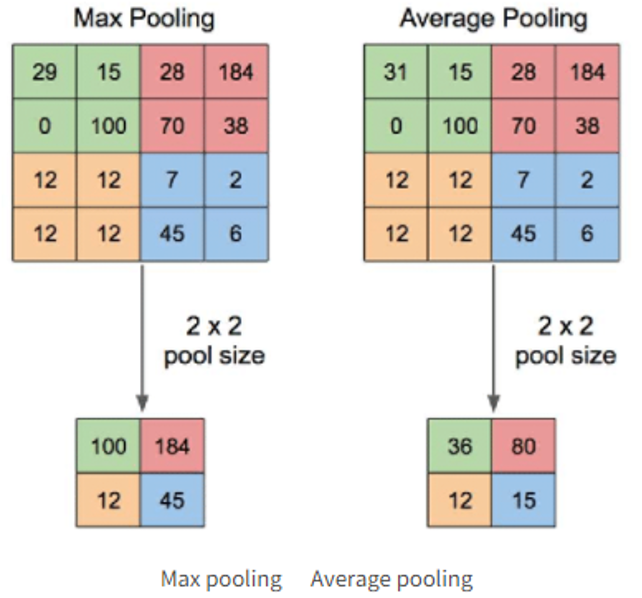

## 4) CNN 필터 학습 특징

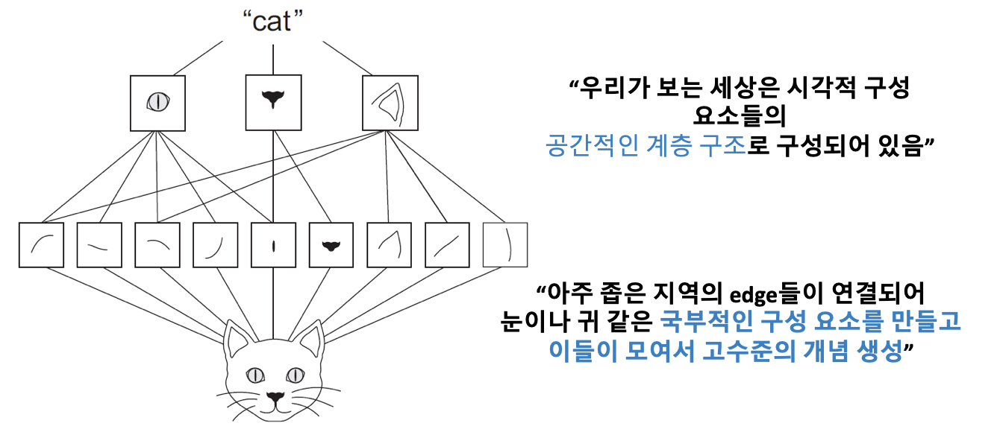

- 공간적 계층 구조 학습
  - 첫 번째 합성곱 층: 에지와 같은 작은 지역 패턴을 학습
  - 두 번째 합성곱 층: 첫 번째 층의 특성으로 구성된 더 큰 패턴(텍스쳐)을 학습 가능
  - 매우 복잡하고 추상적인 시각적 개념을 효과적으로 학습

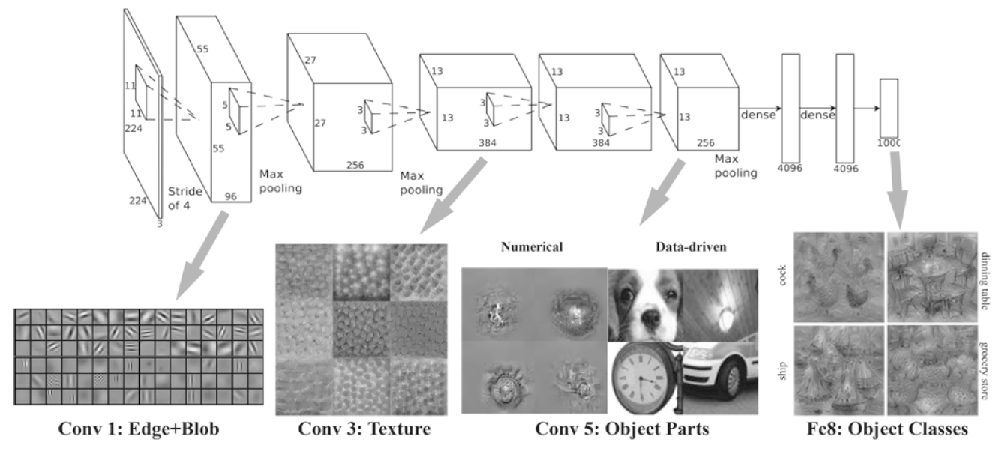

## 5) CNN 종류

### (1) 일반적 CNN(바닐라 CNN)

#### 1] 특징 ♣♣

- Conv-Layer이 중첩되는 구조는 이미지가 클수록 효율적
- CNN이 Output Layer에 다다를 수록 Filter의 개수가 많아짐
  - Low-level feature를 결합하여 high-level feature 생성 
  - Pooling Layer에서 차원을 줄이기 때문에 Feature Map개수를 증가 시킬 수 있음

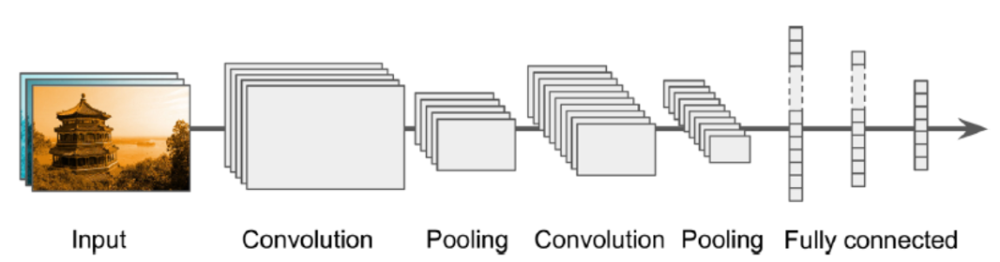

#### 2] 구조

- Conv-Layer을  몇개 쌓고(Relu) Pooling Layer을 쌓는것을 반복
- 맨 위층에는 몇개의 Fully Connected 된 FeedForward 신경망 추가
- 마지막 층에서 예측 출력

#### 3] 예제 

- CNN으로 패션 MNIST 문제 풀기

In [17]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

X_mean = X_train.mean(axis=0, keepdims=True)
X_std = X_train.std(axis=0, keepdims=True) + 1e-7
X_train = (X_train - X_mean) / X_std
X_valid = (X_valid - X_mean) / X_std
X_test = (X_test - X_mean) / X_std

X_train = X_train[..., np.newaxis]
X_valid = X_valid[..., np.newaxis]
X_test = X_test[..., np.newaxis]

4422102/4422102 [==============================] - 0s 0us/step


In [18]:
from functools import partial

DefaultConv2D = partial(keras.layers.Conv2D,
                        kernel_size=3, activation='relu', padding="SAME")

model = keras.models.Sequential([
    DefaultConv2D(filters=64, kernel_size=7, input_shape=[28, 28, 1]),
    keras.layers.MaxPooling2D(pool_size=2),
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    keras.layers.MaxPooling2D(pool_size=2),
    DefaultConv2D(filters=256),
    DefaultConv2D(filters=256),
    keras.layers.MaxPooling2D(pool_size=2),
    keras.layers.Flatten(),
    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=64, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=10, activation='softmax'),
])

(계산 시간이 오래 소요되므로 주의! 매우매우매우 오래걸림)

In [ ]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid))
score = model.evaluate(X_test, y_test)
X_new = X_test[:10] # 새로운 이미지처럼 사용합니다
y_pred = model.predict(X_new)

Epoch 1/10
1719/1719 [==============================] - 999s 580ms/step - loss: 0.7155 - accuracy: 0.7482 - val_loss: 0.3896 - val_accuracy: 0.8602
Epoch 2/10
1719/1719 [==============================] - 916s 533ms/step - loss: 0.4216 - accuracy: 0.8584 - val_loss: 0.3382 - val_accuracy: 0.8770
Epoch 3/10
1719/1719 [==============================] - 808s 470ms/step - loss: 0.3632 - accuracy: 0.8774 - val_loss: 0.3090 - val_accuracy: 0.8926
Epoch 4/10
1719/1719 [==============================] - 798s 464ms/step - loss: 0.3305 - accuracy: 0.8871 - val_loss: 0.2981 - val_accuracy: 0.8986
Epoch 5/10
1719/1719 [==============================] - 791s 460ms/step - loss: 0.3105 - accuracy: 0.8942 - val_loss: 0.2794 - val_accuracy: 0.9006
Epoch 6/10
1719/1719 [==============================] - 790s 459ms/step - loss: 0.2978 - accuracy: 0.8995 - val_loss: 0.3018 - val_accuracy: 0.8996
Epoch 7/10
1719/1719 [==============================] - 801s 466ms/step - loss: 0.2772 - accuracy: 0.9055 - val_

더 복잡한 CNN 모델들:

### (2) LeNet-5 ♣♣

#### 1] 특징

- 1998년 Yann LeCun이 제안
- 특징
  - 네트워크에 주입되기 전 정규화
  - 평균풀링 사용
  - 출력층에서 유클리드 거리 계산

#### 2] 구조

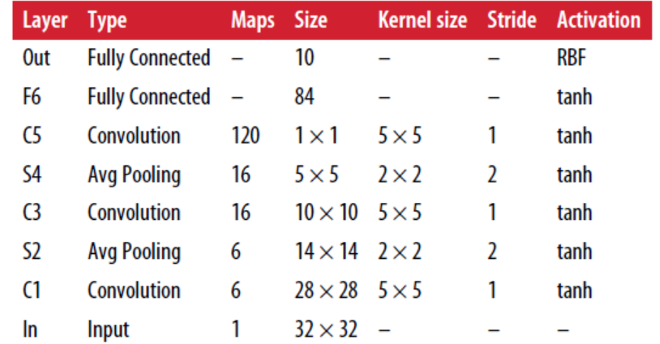

- C1 Layer: 32x32이미지를 6개의 Filter 5x5와 합성 곱 연산 수행 
- S2 Layer: 요즘 Average Pooling과 다른 구조이며 w,b 연산 후 활성화 함수 적용(최근 relu를 쓰는데 당시에는 tanh 사용)
- S4 Layer: Average Pooling, Feature Map으로 5x5 축소 
- C5 Layer: 16개의 5x5를 받아 5x5 kernel로 합성 곱을 수행하여 출력 크기는 1x1 Feature Map 생성 
- F6 Layer: C5결과를 Fully Connected 계산 
- Output Layer: Input Vector과 Weight Vector를 행렬 곱하는 대신 유클리드 거리 출력

### (3) AlexNet ♣♣

#### 1] 특징

- 2012년 이미지넷 대회 우승 (17% top-5 에러율)
- 구조
  - 처음으로 Conv-Layer끼리 쌓음 
  - Drop Out을 적용하여 OverFitting 방지 
  - 이미지 각도, 축 이동 및 명암을 변화 시켜 데이터 증식 
  - 정규화  단계인 LRU(local response normalization)를 사용하여 강하게 활성된 뉴런이 다른 Feature Map에 있는 같은 위치 뉴런 억제 (현재는 잘 안쓰임) ♣♣ 각각의 feature map들이 서로 다른 이미지의 특성들을 반영하도록 만들기 위해
  - Padding
    - VALID: Padding 사용 X
    - SAME: Zero Padding 적용

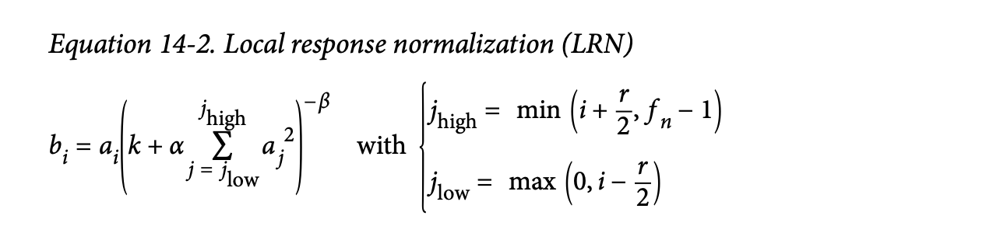

#### 2] 구조

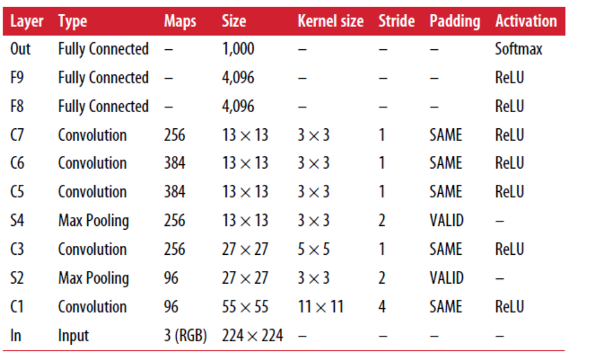

- tanh -> relu 사용

### (4) GoogLeNet

#### 1] 특징

- ILSVRC 2014 대회에서 톱-5 에러율을 7% 이하로 낮춤

- 인셉션 모듈 (inception module) 
  - Sub Network를 통해 이전 구조보다 효과적으로 parameter 사용 
  - AlexNet보다 10배 적은 Prameter 가짐 (6천만개 --> 6백만개로 감소)
  - 4개의 다른 Layer에 Input Data 전달 
  - 2번째로 쓰인 Conv-Layer은 다른 커널 크기를 사용하여 다른 패턴 사용 
  - Stride(S)는 1과 Same Padding 적용 (ReLU 활성화 함수 사용) ♣♣
  - Depth ConCat Layer로 깊이방향으로 연결 ♣♣

#### 2] 구조

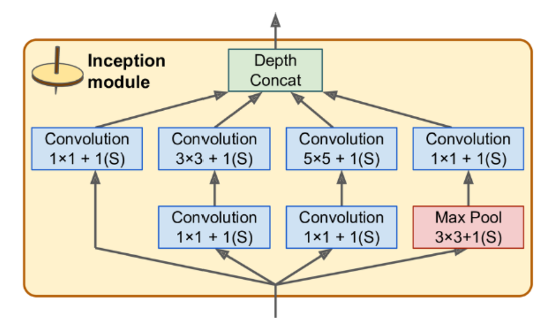

[1] 1x1 커널의 Conv-Layer ♣♣
  - 공간상의 패턴을 잡을 수는 없지만 깊이 차원을 따라 놓인 패턴을 잡을 수 있음
  - 입력보다 더 적은 특성맵을 추출하므로 차원을 줄이는 병목 층(bottleneck layer)의 역할을 담당: 
    - 연산비용, 파라미터 개수를 줄여 훈련속도를 높이고 일반화 성능 향상 (OverFitting 최소화)
  - 비선형성 증가 
    - [1x1, 3x3]이 더 복잡한 패턴 감지 than [5x5] 커널 1개 사용
    - Conv-Layer 쌍은 두개의 층을 가진 신경망으로 이미지를 훓게됨

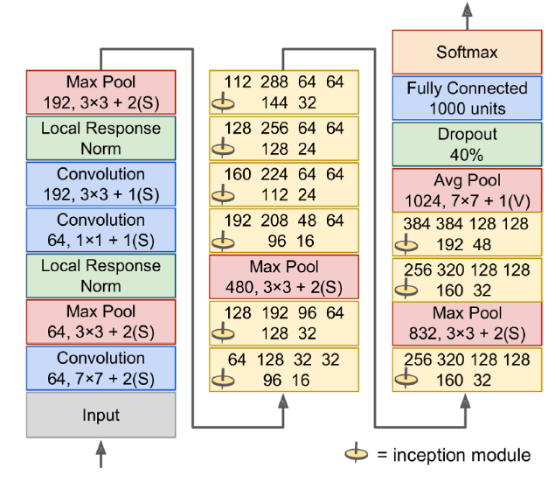

[2] 구조 
  - Network 를 하나로 길게 쌓은 구조 
  - 인셉션 모듈에 있는 여섯 개 숫자는 모듈 안에 있는 합성 곱 층에서 출력하는 feature Map의 수
  - Conv, pooling Layer 
    - 계산 속도 증가 및 양을 줄이기 위해 width, height를 4배로 줄임 
  - LRN Layer (Local Response Norm) 
    - 이전 층이 다양한 특성을 학습하도록 만듦 
  - 2개의 Conv-Layer 은 첫 번째 층(1 * 1)은 병목층으로 작동하고, 두 번째 층(3 * 3)은 효과적인 합성곱 층 역할을 함 
  - LRN Layer 에서 다양한 특성을 학습하도록 만듦 
  - 9개의 인셉션 모듈 및 차원감소와 속도 향상을 위한 Max pool Layer 
  - Global Average pool Layer 
    - 각 feature map 의 평균 출력, 공간 방향 정보 손실 (위치 추정이 아니라 분류 작업이므로 괜찮음)
    - 차원 축소 덕분에 CNN 위에 몇 개의 FC를 둘 필요 없음 (파라미터 감소, overfitting 위험 감소)
  - Output Layer 
    - 규제를 위한 drop out 적용 
    - 1000 개의 Unit 과 softmax 함수를 FC로 확률 값 출력 
  - (위는 간소화된 버전임) 실제 GoogleLeNet 구조는 세 번째와 여섯 번째 인셉션 모듈 위에 연결된 두개의 부가적인 분류기를 포함 
    - 하나의 Average pooling. Conv-Layer, 2개의 FC, SoftMax 로 구성 
    - 훈련시 부가적 분류기의 손실이 (70% 정도 감해져서) 전체 손실에 더해짐 
    - gradient 손실 문제를 줄이고 Network 규제가 목적 (그러나 크게 효과적이지 않음)

- 추후 발전사
  - Inception-v3: https://paperswithcode.com/method/inception-v3
  - Inception-v4: https://paperswithcode.com/method/inception-v4

### (5) VGGNet

#### 1] 특징

- ILSVRC 2014 대회 2등

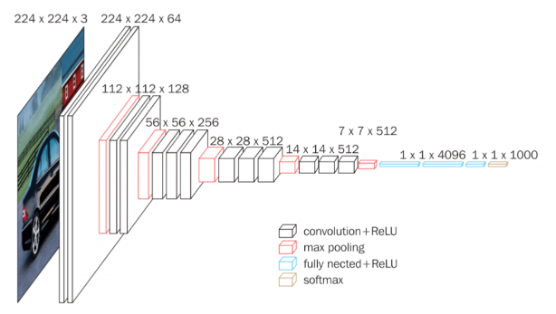

#### 2] 구조

- 2~3개의 Conv Layer 뒤에 pooling layer 가 나오고 다시 반복 하는 방식
- 마지막 dense 는 2개의 hidden layer 와 Output Layer 로 이루어짐 
- 결과적으로 Deep Neural Network를 통해 높은 정확도를 달성 뿐 아니라 단순 파이프라인으로 우수한 성능을 나타냄

### (6) ResNet ♣♣

#### 1] 특징

- ILSVRC 2015 대회 우승 알고리즘 (Kaiming He 등) - 톱-5 에러율 3.6% 이하
- 아이디어
  - 더 적은 파라미터를 사용해 더 깊은 모델을 구성 
  - 핵심 요소는 스킵 연결(skip connection)으로 어떤 층에 주입되는 신호를 상위 층의 출력에도 더해줌

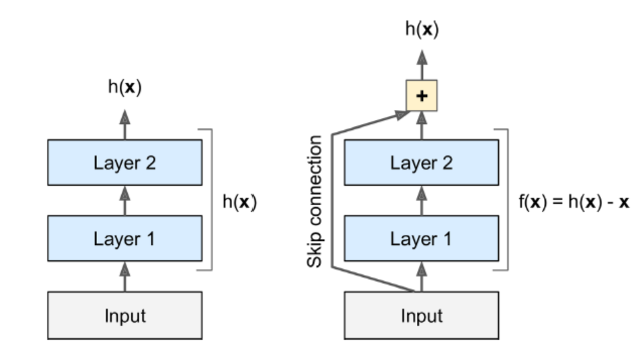

- 잔차학습(Residual Learning) 
  - 본래 신경망을 훈련시킬 때 목적 함수 h(x)를 모델링 하는 것이 목표 
  - 입력x를 네트워크 출력에 더하여(skip connection) 네트워크는 h(x) 대신 f(x)=h(x)-x 를 학습하게 만듦 
  - 잔차 유닛(RU; residual unit): 스킵 연결을 가진 작은 신경망
    - skip connection을  추가 후 신경망 초기화시 Network Input과 같은 값을 출력 (즉, 항등 함수 identity function 모델링 함) 
    - RU의 layer 에서 gradient 가 f’(x)+1 이기 때문에 최소  1 이상을 갖게되어 gradient Vanishing 문제 해결 
    - 목적 함수가 항등 함수와 가까우면 훈련 속도가 매우 빨라짐

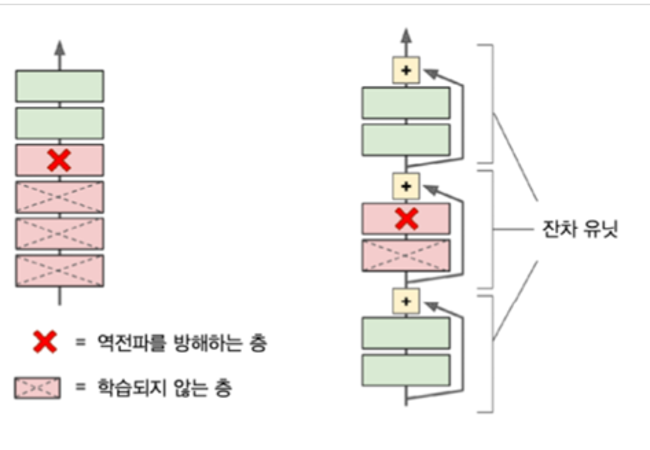

- skip connection 을 많이 추가하면 일부 층이 학습되지 않았더라도 훈련 시작 가능 
- skip connection으로 인해 입력 신호가 전체 네트워크에 쉽게 영향을 미침 
- deep residual Network 는 가장 작은 신경망인 Residual Unit(RU) 을 쌓은 것으로 볼 수 있음

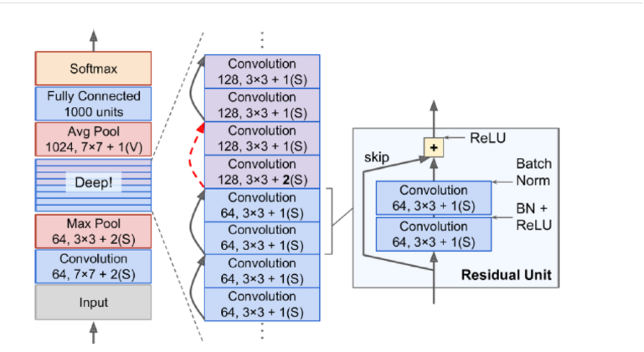

- drop out 층 제외 GoogleLeNet 과 같지만 중간에 RU 를 깊게 쌓음 
- 각 RU는 BN, ReLU, 3x3 kernel을 사용 
  - 공간 정보를 유지하는 두개의 Conv-Layer 가 있음 
- 몇개의 RU 마다 feature map 수는 두배로 늘어나고 높이, 너비는 절반이 됨 (Stride 2) 
- Input 과 output 이 크기가 다른 문제 해결을 위해 stride 2인 1x1 Conn Layer 를 통과 후 더함

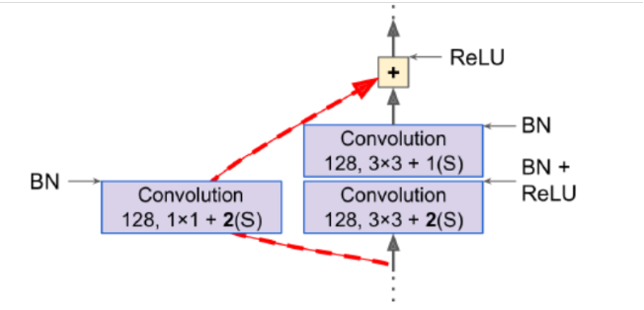

ResNet-34

In [ ]:
DefaultConv2D = partial(keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="SAME", use_bias=False)

class ResidualUnit(keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            keras.layers.BatchNormalization()]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                keras.layers.BatchNormalization()]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [ ]:
model = keras.models.Sequential()
model.add(DefaultConv2D(64, kernel_size=7, strides=2,
                        input_shape=[224, 224, 3]))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Activation("relu"))
model.add(keras.layers.MaxPool2D(pool_size=3, strides=2, padding="SAME"))
prev_filters = 64
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    model.add(ResidualUnit(filters, strides=strides))
    prev_filters = filters
model.add(keras.layers.GlobalAvgPool2D())
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(10, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 112, 112, 64)      9408      
_________________________________________________________________
batch_normalization (BatchNo (None, 112, 112, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 112, 112, 64)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
residual_unit (ResidualUnit) (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_1 (ResidualUni (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_2 (ResidualUni (None, 56, 56, 64)       

### 이 외에도 ♣ 여긴 출제 X

**Xception**
- GoogLeNet과 ResNet의 아이디어를 합침
- 인셉션 모듈을 깊이별 분리 합성곱 층(depthwise separable convolution layer)으로 대체

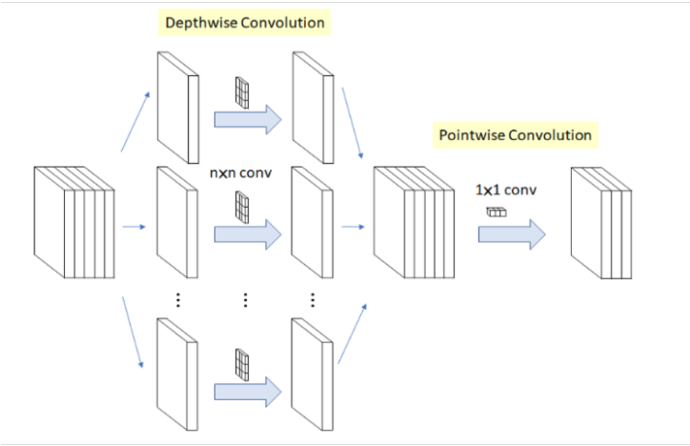

**SENet(squeeze-and-excitation network)**
- ILSVRC 2017 대회 우승자 (인셉션 네트워크와 ResNet 기존 구조를 확장)

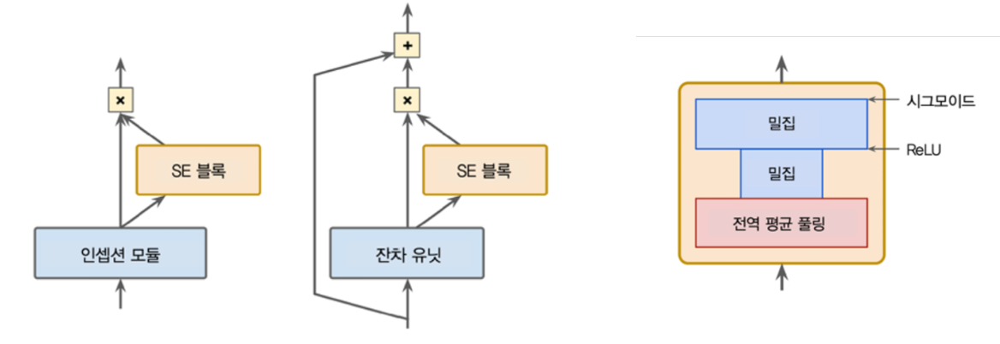

- Browse State-of-the-Art - Papers With Code: https://paperswithcode.com/sota

# 2. 사전훈련된 모델을 사용한 전이 학습

- VGG, ResNet, SENet등 미리 학습된 모델을 이용해 모델의 하위층을 사용할 수 있음 
- 사전 훈련된 가중치가 훼손되는 것을 피하기 위해 작은 학습률 사용

- 사전 훈련된 모델 사용하기

In [ ]:
model = keras.applications.resnet50.ResNet50(weights="imagenet")

102981632/102967424 [==============================] - 1s 0us/step


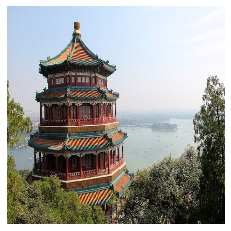

In [ ]:
images_resized = tf.image.resize(images, [224, 224])
plot_color_image(images_resized[0])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


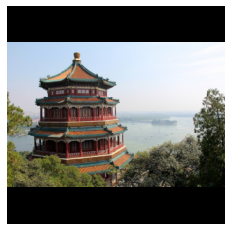

In [ ]:
images_resized = tf.image.resize_with_pad(images, 224, 224, antialias=True)
plot_color_image(images_resized[0])

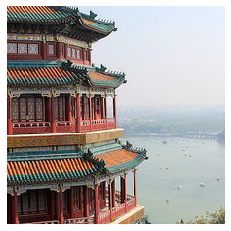

In [ ]:
images_resized = tf.image.resize_with_crop_or_pad(images, 224, 224)
plot_color_image(images_resized[0])
plt.show()

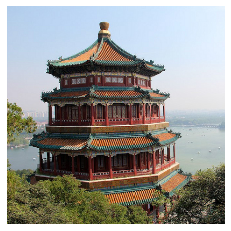

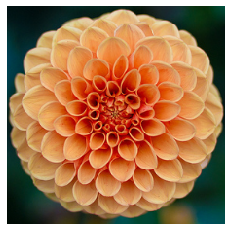

In [ ]:
china_box = [0, 0.03, 1, 0.68]
flower_box = [0.19, 0.26, 0.86, 0.7]
images_resized = tf.image.crop_and_resize(images, [china_box, flower_box], [0, 1], [224, 224])
plot_color_image(images_resized[0])
plt.show()
plot_color_image(images_resized[1])
plt.show()

In [ ]:
inputs = keras.applications.resnet50.preprocess_input(images_resized * 255)
Y_proba = model.predict(inputs)

In [ ]:
Y_proba.shape

(2, 1000)

In [ ]:
top_K = keras.applications.resnet50.decode_predictions(Y_proba, top=3)
for image_index in range(len(images)):
    print("Image #{}".format(image_index))
    for class_id, name, y_proba in top_K[image_index]:
        print("  {} - {:12s} {:.2f}%".format(class_id, name, y_proba * 100))
    print()

49152/35363 [=========================================] - 0s 0us/step
Image #0
  n03877845 - palace       43.39%
  n02825657 - bell_cote    43.07%
  n03781244 - monastery    11.70%

Image #1
  n04522168 - vase         53.96%
  n07930864 - cup          9.52%
  n11939491 - daisy        4.97%



- 전이 학습을 위한 사전 훈련된 모델

In [ ]:
import tensorflow_datasets as tfds

dataset, info = tfds.load("tf_flowers", as_supervised=True, with_info=True)

local data directory. If you'd instead prefer to read directly from our public
GCS bucket (recommended if you're running on GCP), you can instead pass
`try_gcs=True` to `tfds.load` or set `data_dir=gs://tfds-data/datasets`.



Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]


Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [ ]:
info.splits

{'train': <tfds.core.SplitInfo num_examples=3670>}

In [ ]:
info.splits["train"]

<tfds.core.SplitInfo num_examples=3670>

In [ ]:
class_names = info.features["label"].names
class_names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

In [ ]:
n_classes = info.features["label"].num_classes

In [ ]:
dataset_size = info.splits["train"].num_examples
dataset_size

3670

In [ ]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "tf_flowers",
    split=["train[:10%]", "train[10%:25%]", "train[25%:]"],
    as_supervised=True)

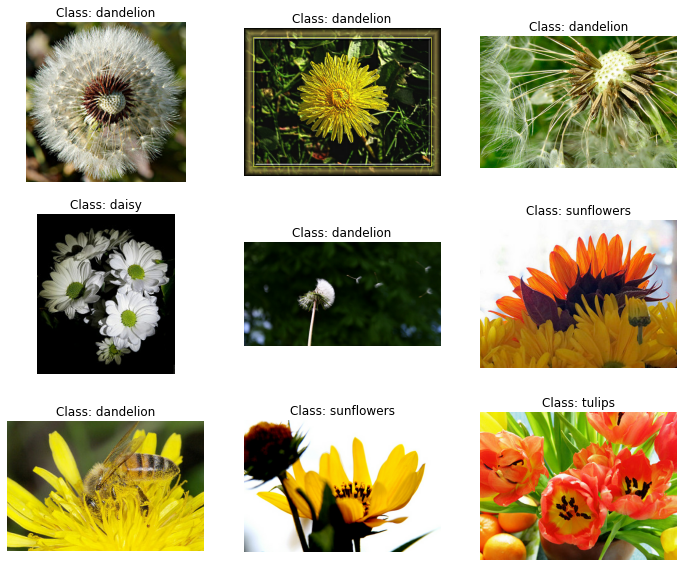

In [ ]:
plt.figure(figsize=(12, 10))
index = 0
for image, label in train_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title("Class: {}".format(class_names[label]))
    plt.axis("off")

plt.show()

- 기본 전처리:

In [ ]:
def preprocess(image, label):
    resized_image = tf.image.resize(image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

- 조금 더 정교한 전처리 (훨씬 많은 데이터 증식):

In [ ]:
def central_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]])
    top_crop = (shape[0] - min_dim) // 4
    bottom_crop = shape[0] - top_crop
    left_crop = (shape[1] - min_dim) // 4
    right_crop = shape[1] - left_crop
    return image[top_crop:bottom_crop, left_crop:right_crop]

def random_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]]) * 90 // 100
    return tf.image.random_crop(image, [min_dim, min_dim, 3])

def preprocess(image, label, randomize=False):
    if randomize:
        cropped_image = random_crop(image)
        cropped_image = tf.image.random_flip_left_right(cropped_image)
    else:
        cropped_image = central_crop(image)
    resized_image = tf.image.resize(cropped_image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

batch_size = 32
train_set = train_set_raw.shuffle(1000).repeat()
train_set = train_set.map(partial(preprocess, randomize=True)).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(preprocess).batch(batch_size).prefetch(1)
test_set = test_set_raw.map(preprocess).batch(batch_size).prefetch(1)

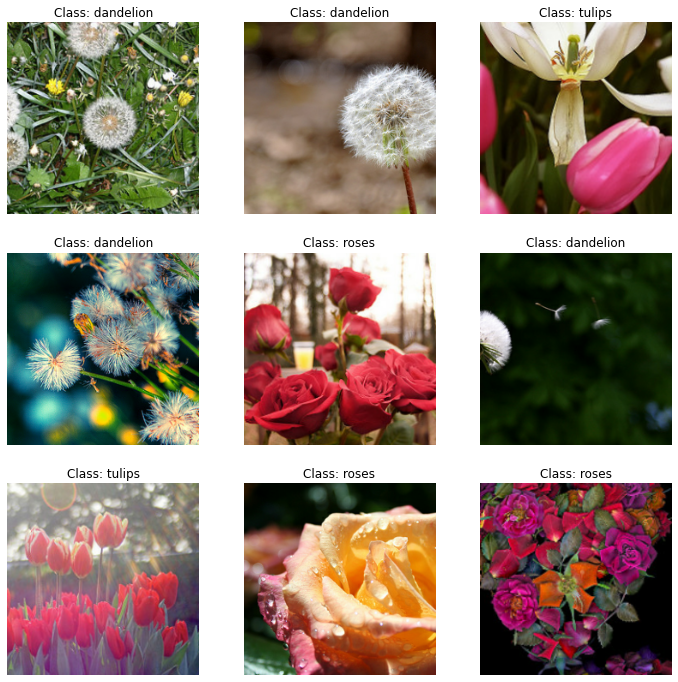

In [ ]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in train_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

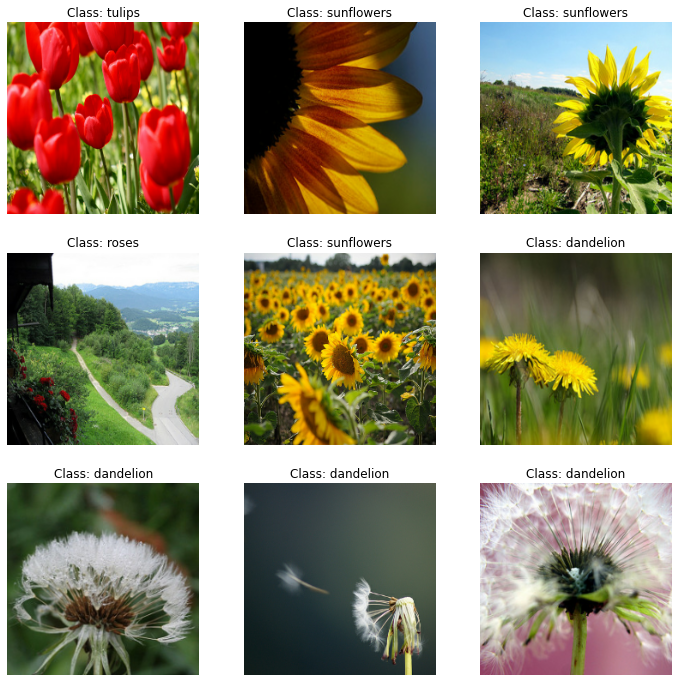

In [ ]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

In [ ]:
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
output = keras.layers.Dense(n_classes, activation="softmax")(avg)
model = keras.models.Model(inputs=base_model.input, outputs=output)

83697664/83683744 [==============================] - 1s 0us/step


In [ ]:
for index, layer in enumerate(base_model.layers):
    print(index, layer.name)

0 input_2
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d_44
13 block2_pool
14 batch_normalization_36
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_45
23 block3_pool
24 batch_normalization_37
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_46
33 block4_pool
34 batch_normalization_38
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_se

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

optimizer = keras.optimizers.SGD(learning_rate=0.2, momentum=0.9, decay=0.01)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5)

Epoch 1/5


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


86/86 [==============================] - 19s 166ms/step - loss: 1.4720 - accuracy: 0.7925 - val_loss: 1.4752 - val_accuracy: 0.8070
Epoch 2/5
86/86 [==============================] - 14s 161ms/step - loss: 0.6576 - accuracy: 0.8914 - val_loss: 0.9815 - val_accuracy: 0.8732
Epoch 3/5
86/86 [==============================] - 14s 163ms/step - loss: 0.3623 - accuracy: 0.9248 - val_loss: 0.8554 - val_accuracy: 0.8732
Epoch 4/5
86/86 [==============================] - 14s 165ms/step - loss: 0.2582 - accuracy: 0.9335 - val_loss: 0.7072 - val_accuracy: 0.8842
Epoch 5/5
86/86 [==============================] - 14s 167ms/step - loss: 0.2029 - accuracy: 0.9440 - val_loss: 0.7266 - val_accuracy: 0.8732


In [ ]:
for layer in base_model.layers:
    layer.trainable = True

optimizer = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9,
                                 nesterov=True, decay=0.001)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=40)

Epoch 1/40
86/86 [==============================] - 61s 654ms/step - loss: 0.3505 - accuracy: 0.8881 - val_loss: 0.5942 - val_accuracy: 0.8346
Epoch 2/40
86/86 [==============================] - 56s 653ms/step - loss: 0.1274 - accuracy: 0.9622 - val_loss: 0.3924 - val_accuracy: 0.8713
Epoch 3/40
86/86 [==============================] - 57s 663ms/step - loss: 0.0621 - accuracy: 0.9800 - val_loss: 0.3522 - val_accuracy: 0.8952
Epoch 4/40
86/86 [==============================] - 57s 669ms/step - loss: 0.0572 - accuracy: 0.9855 - val_loss: 0.2722 - val_accuracy: 0.9228
Epoch 5/40
86/86 [==============================] - 57s 667ms/step - loss: 0.0347 - accuracy: 0.9866 - val_loss: 0.2827 - val_accuracy: 0.9283
Epoch 6/40
86/86 [==============================] - 57s 667ms/step - loss: 0.0209 - accuracy: 0.9935 - val_loss: 0.3221 - val_accuracy: 0.9191
Epoch 7/40
86/86 [==============================] - 58s 672ms/step - loss: 0.0152 - accuracy: 0.9942 - val_loss: 0.2947 - val_accuracy: 0.9265

# 3. 분류와 위치 추정

## 1) 개념

- 이미지에서 물체의 위치를 추정하는 것은 회귀 작업으로 가능 ♣♣ 분류가 아닌 회귀 
- 물체를 둘러싸는 바운딩 박스(bounding box)를 추정하는 방법 
  - 일반적인 방법은 물체 중심의 수평, 수직 좌표의 높이, 너비를 예측하는것 
  - 모델을 크게 바꿀 필요없이 (전역 평균 풀링 층 위에) 4개의 Unit을 가진 두번째 밀집 출력층을 추가하고 MSE loss를 사용해 훈련 ♣♣

In [ ]:
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
class_output = keras.layers.Dense(n_classes, activation="softmax")(avg)
loc_output = keras.layers.Dense(4)(avg)
model = keras.models.Model(inputs=base_model.input,
                           outputs=[class_output, loc_output])
model.compile(loss=["sparse_categorical_crossentropy", "mse"],
              loss_weights=[0.8, 0.2], # 어떤 것을 중요하게 생각하느냐에 따라
              optimizer=optimizer, metrics=["accuracy"])

In [ ]:
def add_random_bounding_boxes(images, labels):
    fake_bboxes = tf.random.uniform([tf.shape(images)[0], 4])
    return images, (labels, fake_bboxes)

fake_train_set = train_set.take(5).repeat(2).map(add_random_bounding_boxes)

In [ ]:
model.fit(fake_train_set, steps_per_epoch=5, epochs=2)

Epoch 1/2
5/5 [==============================] - 6s 630ms/step - loss: 1.3813 - dense_5_loss: 1.6242 - dense_6_loss: 0.4098 - dense_5_accuracy: 0.1562 - dense_6_accuracy: 0.2188
Epoch 2/2
5/5 [==============================] - 3s 655ms/step - loss: 1.3013 - dense_5_loss: 1.5382 - dense_6_loss: 0.3537 - dense_5_accuracy: 0.3187 - dense_6_accuracy: 0.2625


## 2) 학습 방법

- 바운딩 박스를 추정하기 위해서는, 데이터가 바운딩 박스 레이블을 가지고 있어야함 ♣♣
- 이미지에 바운딩 박스를 추가히기 위해 오픈소스 이미지 레이블 도구나 이미지가 매우 많다면 크라우드 소싱 플랫폼을 고려할 수 있음 ♣♣
- 손실함수 
  - MSE외에 좋은 지표로 IoU(Intersection over union)를 사용 ♣♣
    - 바운딩 박스를 얼마나 잘 예측하는지 평가하는 데 널리 사용됨 
    - IoU(Intersection over union)값은 예측한 바운딩 박스와 타깃 바운딩 박스 사이에 중첩된든 영역을 전체 영역으로 나눈 것

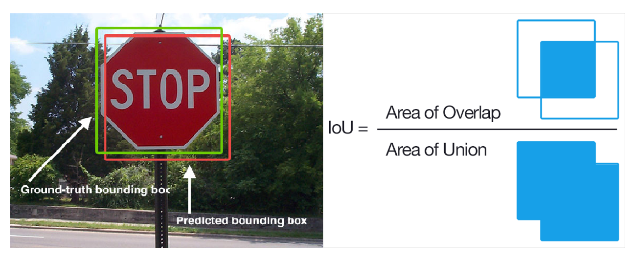

## 3) 객체 탐지 (object detection)

### (1) 개념

- 분류와 위치 추정을 여러 객체에 대해서 수행 ♣♣

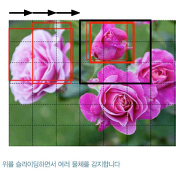

- 하나의 이미지에서 여러 물체를 분류하고 위치를 추정하는 작업 
- 이전에는 하나의 물체를 분류하고 위치를 찾는 분류기를 훈련한 후, 이미지를 모두 훓는 방식을 사용 
  - 조금씩 다른 위치에서 동일한 물체를 여러번 감지함 
  - 불필요한 바운딩 박스를 제거하기 위해 사후 처리가 필요 
  - CNN을 여러번 실행 시켜야 되서 느림 
- 완전 합성곱 신경망(FCN; fully convolutional network)을 사용해 CNN을 빠르게 이미지에 슬라이딩 시킬 수 있음

### 완전 합성곱 신경망 (FCN, Fully Convolutional Network)

- CNN 맨 위의 밀집층을 합성곱 층으로 변환
  - 7x7 크기 512개의 Feature Map을 출력하는 합성곱 층 위에 뉴런이 4096개 있는 Dense Layer이 있을 때 각 뉴런은 합성곱 층에서 출력된 512x7x7 크기의 활성화 값과 bias에 대한 가중치 합을 계산함
  - Dense Layer를 7x7 크기의 필터 4096개와 ‘valid’ 패딩을 사용하는 합성곱 층으로 바꾸면 이 층은 1x1 크기의 Feature Map 4096개를 출력할 것(커널이 입력 Feature Map 크기와 같고 패딩 없음)
  - 즉, Dense 층과 같은 4096개의 숫자가 출력 되는 것 
  - Dense Layer은 특정 입력의 크기를 기대하지만, Conv Layer은 어떤 크기의 이미지도 처리 가능 
  - FCN은 Conv-Layer(그리고 동일한 성질의 풀링 층)만 가지고 어떤 크기의 이미지에서도 훈련/실행 가능

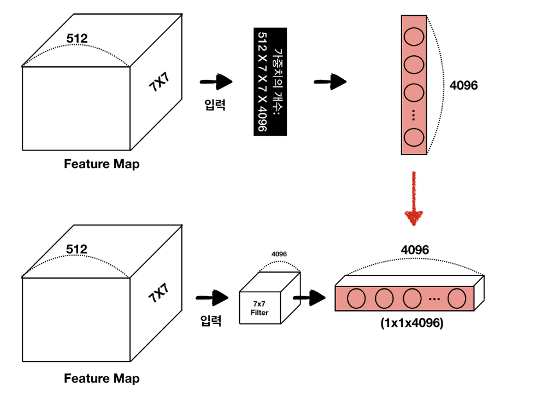

### YOLO ♣♣

Demo: https://www.youtube.com/watch?v=MPU2HistivI

- (YOLOv3 기준으로) 앞서 설명한 구조와 비슷하지만, 각 격자 셀마다 1개가 아닌 5개의 바운딩 박스 출력 ♣♣
  - 바운딩 박스마다 하나의 존재 여부 점수 부여 
  - 20개 클래스가 있는 데이터셋으로 학습하여 격자 셀마다 20개의 클래스 확률 출력 
  - 격자 셀마다 총 45개 숫자가 출력됨 
    - 4개의 좌표를 가진 5개의 바운딩 박스, 5개의 존재여부 점수, 20개의 클래스 확률 
- 바운딩 박스 중심의 절대 좌표 예측이 아닌 격자 셀에 대한 상대 좌표 예측 ♣♣
  - (0,0)은 셀의 왼쪽 위, (1,1)은 오른쪽 아래를 나타냄 
  - 각 격자 셀에 대해 바운딩 박스의 중심이 격자 셀 안에 놓인 것만을 예측하도록 훈련 
  - 로지스틱 함수를 적용하여 바운딩 박스 좌표가 0~1 사이가 되도록 만듦 
- 앵커 박스라 부르는 5개의 대표 바운딩 박스 크기를 찾음 ♣♣
- 네트워크가 다른 스케일을 가진 이미지를 사용하여 훈련됨 ♣♣

### mAP (mean average precision ♣♣

- 객체 탐지에서 널리 사용되는 평가 지표 ♣♣
  - 정밀도/재현율 Trade-off가 발생하지 않는 경우를 측정하기 위해 제안
- 한 분류기가 10%재현율에서 90% 정밀도, 20% 재현율에서 96% 정밀도를 달성한다고 가정 ♣♣
  - 이경우는 trade-off가 없음 
- 10% 재현율에서 정밀도를 보는 것이 아니라 최소 10%재현율에서 분류기가 제공할 수 있는 최대 정밀도를 찾아야함(96%) ♣♣
- 공정한 성능 측정 방법으로 최소0% 재현율에서 얻을 수 있는 최대 정밀도, 그 다음 10% … 100% 까지 재현율에서의 최대 정밀도를 계산 후 이 값을 평균 ♣♣
  - 평균 정밀도 (AP, Average Precision) 이라고 함 
  - 2개 이상의 클래스가 있을때는 각 클래스에 대한 AP계산 후 평균화함 mAP 
- 시스템에 정확한 클래스를 탐지 했지만 위치가 잘못되었다면 올바른 예측으로 포함 시키지 않아야함 ♣♣
  - IoU 임계점을 정의하는 것이 방법

## 8. 시맨틱 분할 (semantic segmentation)

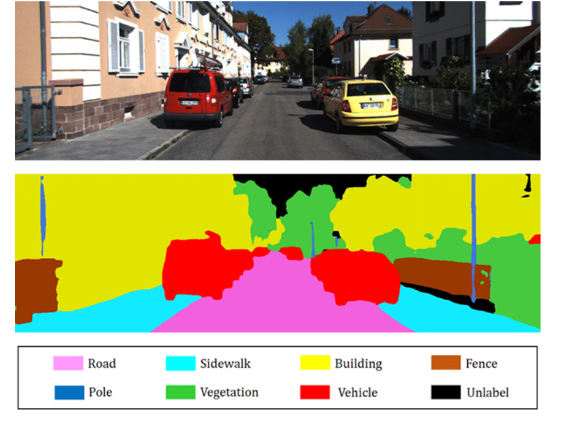

- 물체가 속한 클래스에 따라 이미지의 모든 픽셀을 분류하는 작업 ♣♣
  - 각 픽셀은 픽셀이 속한 객체의 클래스로 분류 
- 클래스가 같은 물체는 구별되지 않음 ♣♣
  - 같은 클래스의 물체가 붙어있으면, 하나의 큰 픽셀 덩어리가 됨 
- 어려운 점은 이미지가 일반적인 CNN을 통과할 때 점진적으로 위치 정보를 잃음(1 이상의 Stride를 사용하는 층 때문) ♣♣
  - 보통은 CNN은 이미지의 왼쪽 아래에 보도가 있다고 알 수 있지만 그 보다 정확히 알지 못함 --> 2015년 해결책이 제안됨

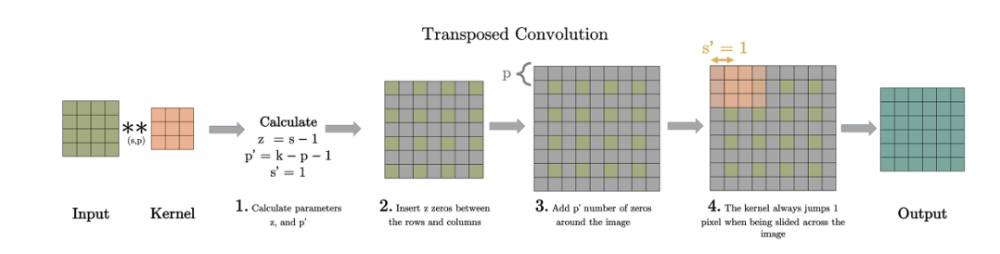

- 사전 훈련된 CNN을 FCN으로 변환 --> 이 CNN이 입력 이미지에 적용하는 전체 Stride는 32(1보다 큰 Stride도 모두 더한 것) ♣♣
- 이는 마지막 층 입력이미지보다 32배나 작은 Feature Map을 출력 한다는 것 --> 따라서 해상도를 늘리기 위한 업샘플링 층(upsampling layer) 추가 ♣♣

- 해상도를 32배로 늘리는 UpSampling을 하나 추가 ♣♣
- 이중 선형 보간: 4~8배로 늘리는데 적합 ♣♣
- 전치 합성곱 층(transposed convolutional layer): ♣♣
  - 이층은 먼저 이미지에 빈 행과 열을 삽입하여 늘린 다음 합성곱 수행 
  - 선형 보간에 가까운 작업을 수행하도록 초기화 할 수 있지만 훈련되는 층이기 때문에 훈련 과정에서 더 잘 학습 될 수 있음

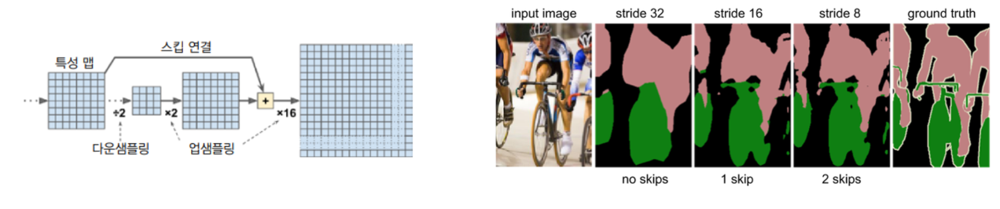

- 정확도를 높이기 위해 아래쪽 층부터 Skip Connection 추가 ♣♣
  - 2배 출력 이미지를 업셈플링 하고, 아래 쪽 층의 출력을 더해줌 
- 그 다음 16배로 늘려 UpSampling하여 최종적으로 32배의 UpSampling을 달성함 ♣♣
- 이 방식은 Pooling Layer에서 잃은 공간 정보를 복원 ♣♣
- 원본 이미지 크기보다 더 크게 UpSampling 가능 --> 초해상도 (super-resolution) ♣♣

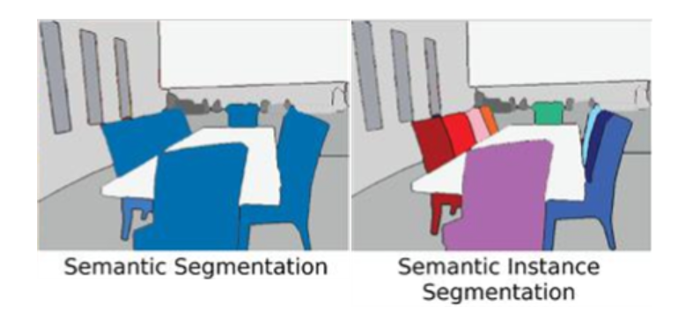

- 인스턴스 분할 ♣♣♣
  - 시맨틱 분할과 비슷하지만 동일한 클래스 물체를 하나의 덩어리로 합치지 않고 각 물체를 구분하여 표시
  - 현재 텐서플로 모델 프로젝트에 포함된 인스턴스 분할 모델은 Mask R-CNN
  - 이 모델은 Fast R-CNN 모델을 확장하여 각 바운딩 박스에 대한 픽셀 마스크 추가 생성 ♣♣
  - 물체마다 클래스 추정 확률과 바운딩 박스를 얻는 것뿐만 아니라 바운딩 박스의 물체의 픽셀을 구별하는 픽셀 마스크도  얻을 수 있음 ♣♣

- 이외에도 다양한 이미지 분야 발전 ♣♣
  - 적대적 학습(adversariel learning): 네트워크를 속이는 이미지에 더 안전한 네트워크를 학습
  - 설명가능성(explainability): 왜 네트워크가 특정 분류를 수행했는지 설명
  - 이미지 생성(image generation): 현실같은 이미지를 생성
  - 싱글-샷 학습(single-shot learning): 객체를 한 번 본 후에 인식할 수 있는 시스템